In [1]:
import numpy as np
import scipy.stats as stats
import pandas as pd
import matplotlib.pyplot as plt
import utils as utils
# Set my plot theme
# See here for more detials
# https://github.com/RishiSadhir/rethinking2/blob/master/utils/plotting.py
utils.set_theme()
COLOR = "#2A0933"

## 4.1 - Why normal distributions are normal

The normal distribution arrises in many many ways. 

**Python code 4.1 and figure 4.2**

One way it comes about is by adding distributions together. In fact, any process that adds together random values from teh same distribution converges to a normal distribution.

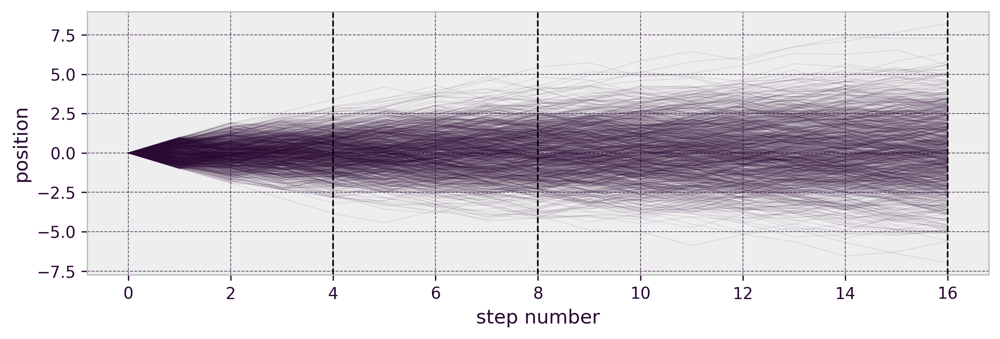

In [2]:
# Python code 4.1
n_steps = 16
n_people = 1000
pos = np.random.uniform(-1, 1, (n_people, n_steps))

# Figure 4.2.a
fig, ax = plt.subplots(figsize=(10,3))
ax.set_xlabel("step number")
ax.set_ylabel("position")
for person in range(n_people):
    x = np.arange(0, n_steps+1)
    y = np.cumsum(pos[person,:])
    y = np.insert(y, 0, 0., axis=0)
    ax.plot(x, y, color = COLOR, alpha = .1, linewidth=.5)
ax.axvline(x=4, linestyle='--', color = "black", linewidth = 1)
ax.axvline(x=8, linestyle='--', color = "black", linewidth = 1)
ax.axvline(x=16, linestyle='--', color = "black", linewidth = 1)
plt.show()

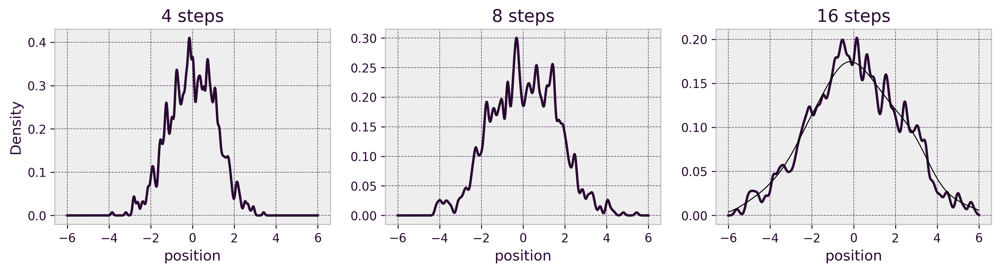

In [3]:
# Figure 4.2.b
fig, axes = plt.subplots(figsize=(14,3), ncols = 3)

x = np.linspace(-6, 6, 1000)

samples = np.apply_along_axis(np.sum, 1, pos[:,0:4])
axes[0].plot(x, utils.build_dens(samples, x, .05), color = COLOR)
axes[0].set_ylabel("Density")
axes[0].set_title("4 steps")
samples = np.apply_along_axis(np.sum, 1, pos[:,0:8])
axes[1].plot(x, utils.build_dens(samples, x, .05), color = COLOR)
axes[1].set_title("8 steps")
samples = np.apply_along_axis(np.sum, 1, pos[:,0:16])
axes[2].plot(x, utils.build_dens(samples, x, .05), color = COLOR)
axes[2].plot(x, utils.build_dens(samples, x, .3), color = "black", linewidth = .8)
axes[2].set_title("16 steps")
for i in [0,1,2]:
    axes[i].set_xlabel("position")
plt.show()

**Python code 4.2 to 4.5**

You really do just keep making normals as you combine distributions with themselves in different ways.

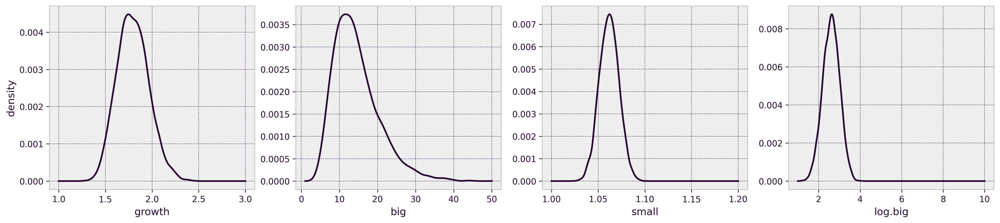

In [4]:
fig, axes = plt.subplots(figsize=(20, 4), ncols = 4)

# Python code 4.2 and 4.3
x = np.linspace(1, 3, 1000)
growth = 1 + np.random.uniform(0, .1, (10000, 12))
samples = np.apply_along_axis(np.prod, 1, growth)
axes[0].plot(x, utils.build_dens(samples, x, norm=True), color = COLOR)
axes[0].set_ylabel("density")
axes[0].set_xlabel("growth")

# Python code 4.4
x = np.linspace(1, 50, 1000)
growth = 1 + np.random.uniform(0, .5, (10000, 12))
samples = np.apply_along_axis(np.prod, 1, growth)
axes[1].plot(x, utils.build_dens(samples, x, norm=True), color = COLOR)
axes[1].set_xlabel("big")

x = np.linspace(1, 1.2, 1000)
growth = 1 + np.random.uniform(0, .01, (10000, 12))
samples = np.apply_along_axis(np.prod, 1, growth)
axes[2].plot(x, utils.build_dens(samples, x, norm=True), color = COLOR)
axes[2].set_xlabel("small")

# Pythong code 4.5
x = np.linspace(1, 10, 1000)
growth = 1 + np.random.uniform(0, .5, (10000, 12))
samples = np.apply_along_axis(np.prod, 1, growth)
samples = np.log(samples)
axes[3].plot(x, utils.build_dens(samples, x, norm=True), color = COLOR)
axes[3].set_xlabel("log.big")

plt.show()

## 4.2 - A language for describing models

To train our first model, we'll load up the !Kung San dataset.
**Python code 4.7 to 4.11**

In [5]:
d = utils.data_from_R("Howell1", "rethinking")
d2 = d[d['age'] >= 18]
d2.describe()

,height,weight,age,male
count,352.000000,352.000000,352.000000,352.000000
mean,154.597093,44.990486,41.138494,0.468750
std,7.742332,6.456708,15.967855,0.499733
min,136.525000,31.071052,18.000000,0.000000
25%,148.590000,40.256290,28.000000,0.000000
50%,154.305000,44.792210,39.000000,0.000000
75%,160.655000,49.292693,51.000000,1.000000
max,179.070000,62.992589,88.000000,1.000000


We're going to train a model of human height. Lets start with a prior predictive check.

**Python code 4.12 to Python code 4.14 and figure 4.3**

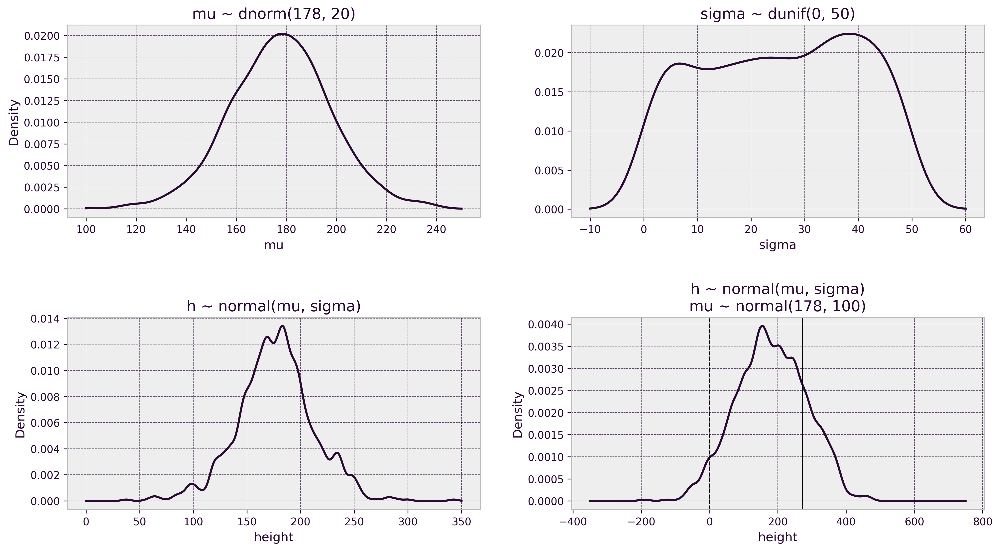

In [6]:
fig, axes = plt.subplots(figsize=(14, 8), ncols = 2, nrows = 2)

# Python code 4.12
x = np.linspace(100, 250, 1000)
mu = stats.norm.rvs(178, 20, 1000)
y = utils.build_dens(mu, x)
axes[0, 0].plot(x, y, color = COLOR)
axes[0, 0].set_xlabel("mu")
axes[0, 0].set_ylabel("Density")
axes[0, 0].set_title("mu ~ dnorm(178, 20)")

# Python code 4.13
x = np.linspace(-10, 60, 1000)
sigma = stats.uniform.rvs(0, 50, 1000)
y = utils.build_dens(sigma, x, .25)
axes[0, 1].plot(x, y, color = COLOR)
axes[0, 1].set_xlabel("sigma")
axes[0, 1].set_title("sigma ~ dunif(0, 50)")

# Python code 4.14
x = np.linspace(0, 350, 1000)
prior_h = stats.norm.rvs(mu, sigma, 1000)
y = utils.build_dens(prior_h, x, .11)
axes[1, 0].plot(x, y, color = COLOR)
axes[1, 0].set_xlabel("height")
axes[1, 0].set_ylabel("Density")
axes[1, 0].set_title("h ~ normal(mu, sigma)")

# Python code 4.15
x = np.linspace(-350, 750, 1000)
mu = stats.norm.rvs(178, 100, 1000)
prior_h = stats.norm.rvs(mu, sigma, 1000)
y = utils.build_dens(prior_h, x, .14)
axes[1,1].plot(x, y, color = COLOR)
axes[1,1].set_xlabel("height")
axes[1,1].set_ylabel("Density")
axes[1,1].set_title("h ~ normal(mu, sigma)\nmu ~ normal(178, 100)")

# Figure 4.3
axes[1, 1].axvline(x=0, linestyle='--', color = "black", linewidth = 1)
axes[1, 1].axvline(x=272, color = "black", linewidth = 1)

fig.tight_layout(pad=3.0)
plt.show()

**Python code 4.16 to 4.18**

We start by training a model of human height via grid approximation. There are two parameters here so things are a bit more complicated. First we calculate the log-likelihood of each parameter combination. Then we add the priors. I emphasize add because we are in log space. Then we `exp` back in to probability space.

In [7]:
mu_list = np.linspace(150, 160, 200)
sigma_list = np.linspace(4, 9, 200)
post = np.array([(x, y) for x in mu_list for y in sigma_list])

post = pd.DataFrame({
    "mu": post[:,0],
    "sigma": post[:,1]
})

def find_ll(moments, y):
    vec = stats.norm.logpdf(y, moments[0], moments[1])
    return np.sum(vec)

post["LL"] = post.apply(find_ll, 1, args=[d2['height']])

post["prod"] = post["LL"] + \
    stats.norm.logpdf(post['mu'], 178, 20) + \
    stats.uniform.logpdf(post['sigma'], 0, 50)

post['prob'] = np.exp(post['prod'] - max(post['prod']))

post.describe()

,mu,sigma,LL,prod,prob
count,40000.000000,40000.000000,40000.000000,40000.000000,4.000000e+04
mean,155.000000,6.500000,-1307.904590,-1316.403056,1.505148e-02
std,2.901258,1.450629,94.315976,94.299550,8.537704e-02
min,150.000000,4.000000,-1790.055005,-1798.286698,1.958497e-248
25%,152.500000,5.250000,-1345.266676,-1353.755305,2.235936e-55
50%,155.000000,6.500000,-1272.814725,-1281.337678,6.310012e-24
75%,157.500000,7.750000,-1239.504583,-1248.001447,1.895712e-09
max,160.000000,9.000000,-1219.407716,-1227.917773,1.000000e+00


**Python code 4.19 to 4.2 and figure 4.4**

Now lets sample from the posterior and plot the joint distribution.

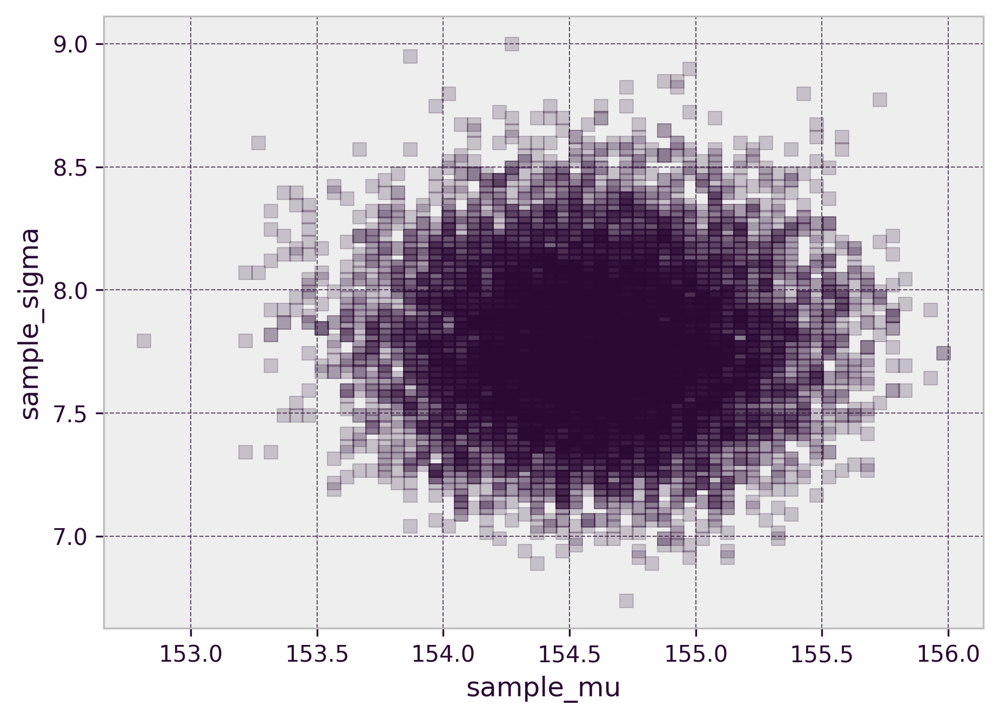

In [8]:
prob = post['prob'].values / np.sum(post['prob'].values)
sample_rows = np.random.choice(np.arange(len(post)), size = 10000, replace=True, p=prob).tolist()
sample_mu = post['mu'][sample_rows]
sample_sigma = post['sigma'][sample_rows]
fig, ax = plt.subplots(figsize=(7,5))
ax.scatter(sample_mu, sample_sigma, alpha = .2, marker='s', color=COLOR)
ax.set_xlabel("sample_mu")
ax.set_ylabel("sample_sigma")
plt.show()

**Python code 4.21 and 4.22**

We can also examine the marginal distributions.

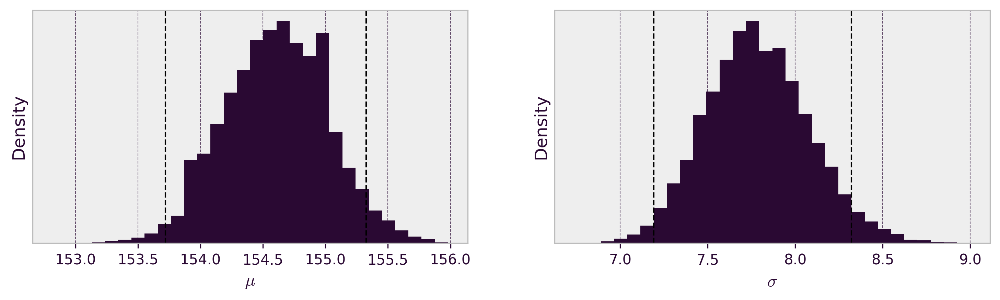

In [9]:
mu_low, mu_high = utils.hpdi(sample_mu)
sigma_low, sigma_high = utils.hpdi(sample_sigma)
fig, axes = plt.subplots(figsize=(12, 3), ncols=2)
axes[0].axvline(x=mu_low, color = "black", linewidth=1, linestyle="--")
axes[0].axvline(x=mu_high, color = "black", linewidth=1, linestyle="--")
axes[0].hist(sample_mu, bins = 30, color=COLOR)
axes[0].set_xlabel("$\mu$")
axes[0].set_ylabel("Density")
axes[0].set_yticks([])
axes[1].axvline(x=sigma_low, color = "black", linewidth=1, linestyle="--")
axes[1].axvline(x=sigma_high, color = "black", linewidth=1, linestyle="--")
axes[1].hist(sample_sigma, bins = 30, color=COLOR)
axes[1].set_xlabel("$\sigma$")
axes[1].set_ylabel("Density")
axes[1].set_yticks([])
plt.show()

At this point in the book, we leave our old friend grid approximation behind and we're _supposed_ to move on to quadratic approximation. We're actually going to blow right through that and use PyStan and MCMC directly. Why? Because the models in this stage of the book aren't complex enough for any of MCMC's ugly complexities to rear their head.

In [10]:
import pystan as ps

In [11]:
%load_ext jupyterstan

**Python code 4.31 to 4.35**

Lets build our first model!

\begin{align}
h_i &\sim Normal(\mu, \sigma) \\
\mu &\sim Normal(178, 20) \\
\sigma &\sim Uniform(0, 50)
\end{align}

In [12]:
%%stan m4_2
data {
  int N;
  vector[N] height;
}
parameters {
  real mu;
  real<lower=0> sigma;
}
model {
  mu ~ normal(178, 20);
  sigma ~ normal(178, 20);
  height ~ normal(mu, sigma);
}

INFO:pystan:COMPILING THE C++ CODE FOR MODEL m4_2_54a4dd4d4bf2a0193533490f1260a632 NOW.


Creating pystan model & assigning it to variable name "m4_2".
Stan options:
 {'model_name': 'm4_2', 'include_paths': None, 'boost_lib': None, 'eigen_lib': None, 'verbose': False, 'obfuscate_model_name': True}
StanModel now available as variable "m4_2"!
Compilation took 38 seconds.


In [13]:
height = d2['height'].tolist()
d_dict = {"N": len(height), "height":height}
fit = m4_2.sampling(data=d_dict, chains=4, n_jobs=4, refresh = 0)
print(fit.stansummary(probs=[.055, .945]))

Inference for Stan model: m4_2_54a4dd4d4bf2a0193533490f1260a632.
4 chains, each with iter=2000; warmup=1000; thin=1; 
post-warmup draws per chain=1000, total post-warmup draws=4000.

        mean se_mean     sd   5.5%  94.5%  n_eff   Rhat
mu    154.61  6.8e-3   0.42 153.94 155.27   3744    1.0
sigma   7.81  5.1e-3    0.3   7.34    8.3   3391    1.0
lp__  -931.8    0.02    1.0 -933.7 -930.8   1717    1.0

Samples were drawn using NUTS at Sat 11 Apr 2020 04:27:07 PM .
For each parameter, n_eff is a crude measure of effective sample size,
and Rhat is the potential scale reduction factor on split chains (at 
convergence, Rhat=1).


We can look at the variance-covariance matrix implied by the posterior distribution.

In [14]:
post = fit.extract(["mu", "sigma"])
np.cov(np.array([post['mu'], post['sigma']]))

array([[0.17461412, 0.00166384],
       [0.00166384, 0.08962961]])

## 4.4 - Linear Prediction

We're going to add a predictor to our linear regression -- weight (x). 

**Python code 4.37**

Here is the model we're going to train.

\begin{align}
h_i &\sim Normal(\mu_i, \sigma) & \text{[likelihood]} \\
\mu_i &= \alpha + \beta(x_i - \bar{x}) & \text{[linear model]} \\
\alpha &\sim Normal(178, 20) & \text{[} \alpha \text{ prior]} \\
\beta &\sim Normal(0, 10) & \text{[} \beta\text{ prior]} \\
\sigma &\sim Uniform(0, 50) & \text{[} \sigma\text{ prior]} \\
\end{align}

Lets plot the relationship first though.

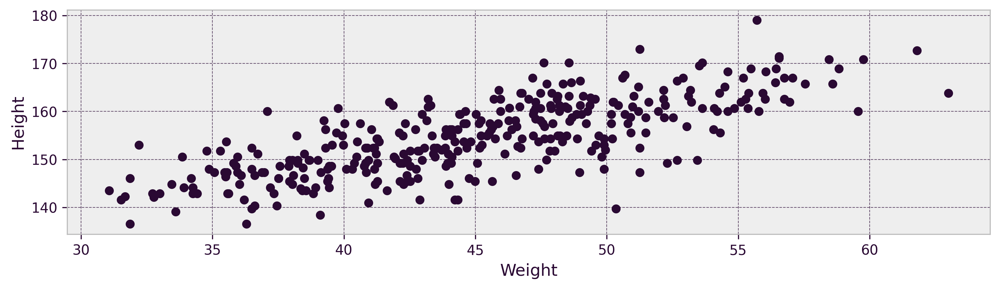

In [15]:
fig, ax = plt.subplots(figsize=(12, 3))
ax.scatter(d2['weight'], d2['height'], color = COLOR)
ax.set_xlabel("Weight")
ax.set_ylabel("Height")
plt.show()

**Python code 4.38 to 4.41**

Next, lets check out those priors with a prior predictive simulation.

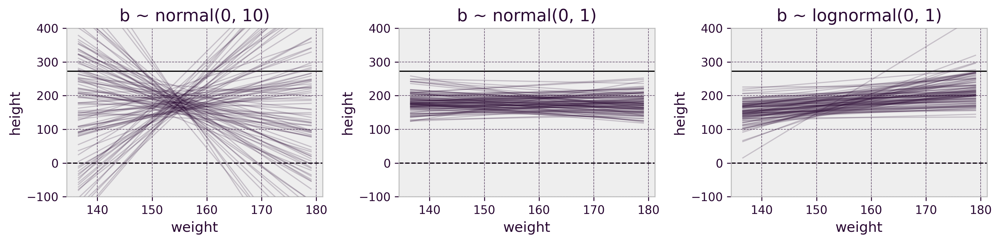

In [18]:
N=100
a = stats.norm.rvs(178, 20, N)
b = stats.norm.rvs(0, 10, N)

fig, axes = plt.subplots(figsize=(12, 3), ncols=3)

xseq = np.linspace(min(d2['height']), max(d2['height']), 1000)
xbar = np.mean(d2['height'])
for i in range(100):
    y = a[i] + b[i]*(xseq - xbar)
    axes[0].plot(xseq, y, color = COLOR, alpha = .2, linewidth = 1, zorder=10)
axes[0].axhline(0, color = "black", linewidth = 1, linestyle="--", zorder=1)
axes[0].axhline(272, color = "black", linewidth = 1, zorder=1)
axes[0].set_yticks([-100, 0, 100, 200, 300, 400])
axes[0].set_ylim([-100, 400])
axes[0].set_xlabel("weight")
axes[0].set_ylabel("height")
axes[0].set_title("b ~ normal(0, 10)")

b = stats.norm.rvs(0, 1, N)

for i in range(100):
    y = a[i] + b[i]*(xseq - xbar)
    axes[1].plot(xseq, y, color = COLOR, alpha = .2, linewidth = 1, zorder=10)
axes[1].axhline(0, color = "black", linewidth = 1, linestyle="--", zorder=1)
axes[1].axhline(272, color = "black", linewidth = 1, zorder=1)
axes[1].set_yticks([-100, 0, 100, 200, 300, 400])
axes[1].set_ylim([-100, 400])
axes[1].set_xlabel("weight")
axes[1].set_ylabel("height")
axes[1].set_title("b ~ normal(0, 1)")

b = stats.lognorm.rvs(1, 0, 1, N)

for i in range(100):
    y = a[i] + b[i]*(xseq - xbar)
    axes[2].plot(xseq, y, color = COLOR, alpha = .2, linewidth = 1, zorder=10)
axes[2].axhline(0, color = "black", linewidth = 1, linestyle="--", zorder=1)
axes[2].axhline(272, color = "black", linewidth = 1, zorder=1)
axes[2].set_yticks([-100, 0, 100, 200, 300, 400])
axes[2].set_ylim([-100, 400])
axes[2].set_xlabel("weight")
axes[2].set_ylabel("height")
axes[2].set_title("b ~ lognormal(0, 1)")

plt.tight_layout()

plt.show()

Finally, lets find the posterior. We'll go with the lognormal model:

\begin{align}
h_i &\sim Normal(\mu_i, \sigma) & \text{[likelihood]} \\
\mu_i &= \alpha + \beta(x_i - \bar{x}) & \text{[linear model]} \\
\alpha &\sim Normal(178, 20) & \text{[} \alpha \text{ prior]} \\
\beta &\sim Lognormal(0, 1) & \text{[} \beta\text{ prior]} \\
\sigma &\sim Uniform(0, 50) & \text{[} \sigma\text{ prior]} \\
\end{align}

**Python code 4.42 to 4.45**


In [19]:
%%stan m4_3
data {
  int N;
  vector[N] height;
  vector[N] weight;
}
transformed data {
  real wbar;
  wbar = mean(weight);
}
parameters {
    real alpha;
    real<lower=0> beta;
    real<lower=0,upper=50> sigma;
}
model {
  sigma ~ uniform( 0 , 50 );
  beta ~ lognormal( 0 , 1 );
  alpha ~ normal( 178 , 20 );
  
  height ~ normal(alpha + beta*(weight - wbar), sigma );
}

INFO:pystan:COMPILING THE C++ CODE FOR MODEL m4_3_d31e2fce98b50c2e10a37b6cb77b1366 NOW.


Creating pystan model & assigning it to variable name "m4_3".
Stan options:
 {'model_name': 'm4_3', 'include_paths': None, 'boost_lib': None, 'eigen_lib': None, 'verbose': False, 'obfuscate_model_name': True}
StanModel now available as variable "m4_3"!
Compilation took 40 seconds.


In [20]:
d_dict = {
    "N": len(d2.index), 
    "height": d2['height'].tolist(),
    "weight": d2['weight'].tolist()
}

fit = m4_3.sampling(data=d_dict, chains=4, n_jobs=4, refresh = 0)
print(fit.stansummary(probs=[.055, .945]))

Inference for Stan model: m4_3_d31e2fce98b50c2e10a37b6cb77b1366.
4 chains, each with iter=2000; warmup=1000; thin=1; 
post-warmup draws per chain=1000, total post-warmup draws=4000.

        mean se_mean     sd   5.5%  94.5%  n_eff   Rhat
alpha  154.6  4.4e-3   0.27 154.17 155.04   3870    1.0
beta     0.9  6.9e-4   0.04   0.84   0.97   3740    1.0
sigma    5.1  3.3e-3   0.19    4.8   5.42   3501    1.0
lp__  -748.2    0.03   1.26 -750.6 -746.9   1712    1.0

Samples were drawn using NUTS at Sat 11 Apr 2020 04:28:31 PM .
For each parameter, n_eff is a crude measure of effective sample size,
and Rhat is the potential scale reduction factor on split chains (at 
convergence, Rhat=1).


In [21]:
post = fit.extract(['alpha', 'beta', 'sigma'])
np.cov([post['alpha'], post['beta'], post['sigma']])

array([[ 0.07446557, -0.00034604, -0.00059728],
       [-0.00034604,  0.0017991 ,  0.00024143],
       [-0.00059728,  0.00024143,  0.0377608 ]])

Now that we've got tables out of the way, lets plot various summaries of our posterior distribution.

**Python code 4.4 and 4.47**

We'll start by just plotting the MAP values against actuals.

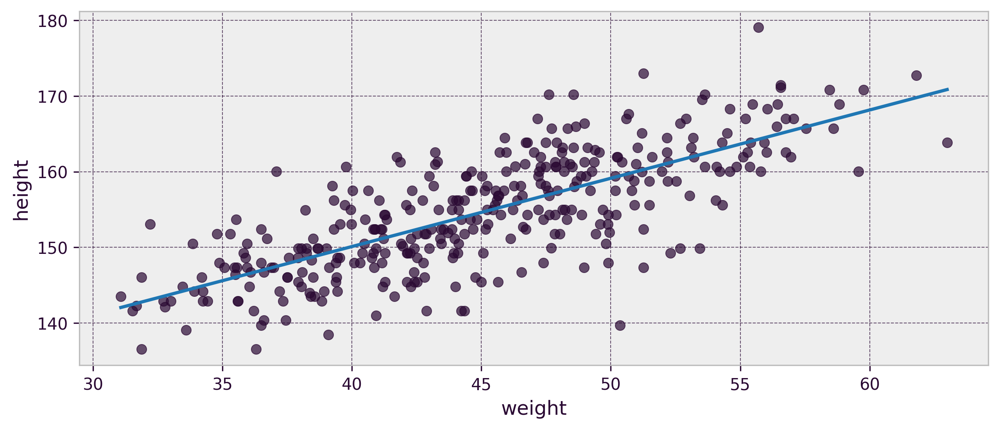

In [22]:
fig, ax = plt.subplots(figsize = (10, 4))
alpha = np.mean(post['alpha'])
beta = np.mean(post['beta'])
xseq = np.linspace(min(d2['weight']), max(d2['weight']), 1000)
ax.scatter(d2['weight'], d2['height'], alpha = .7, color = COLOR)
y = alpha + beta*(xseq - np.mean(d2['weight']))
ax.plot(xseq, y)
ax.set_xlabel("weight")
ax.set_ylabel("height")
plt.show()

**Python code 4.48 and 4.49 and figure 4.7**

Now we plot 20 random draws for the posterior distribution. We do this for times for different subsamples of the data to show how our uncertainty changes with how big our data is.

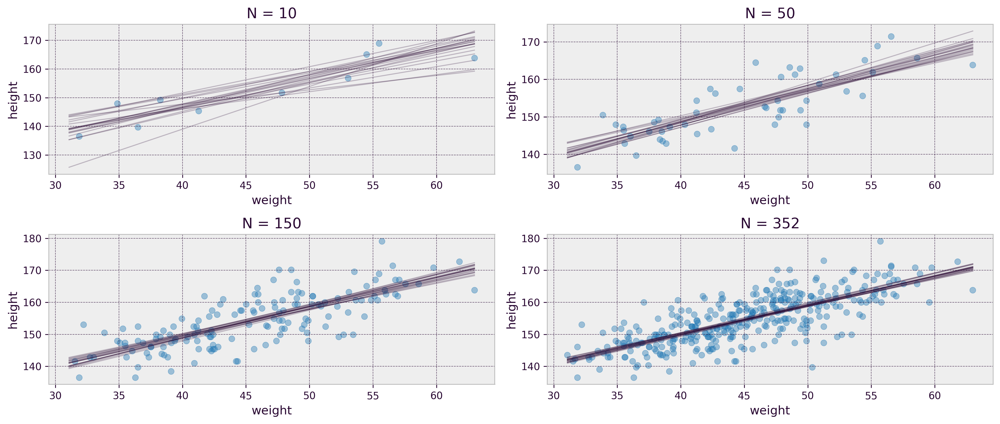

In [23]:
fits = [None]*4

enns = [10, 50, 150, 352]
for i, N in enumerate(enns):
    d_dict = {
        "N": N,
        "height": d2['height'].tolist()[0:N],
        "weight": d2['weight'].tolist()[0:N]}
    fits[i] = m4_3.sampling(data=d_dict, chains=4, n_jobs=4, refresh = 0)

fig, ax = plt.subplots(figsize = (14, 6), nrows = 2, ncols = 2)

k = 0
xseq = np.linspace(min(d2['weight']), max(d2['weight']), 1000)
for i in [0, 1]:
    for j in [0, 1]:
        post = fits[k].extract(['alpha', 'beta'])
        p_alpha = post['alpha'][0:20]
        p_beta = post['beta'][0:20]
        x = d2['weight'][0:enns[k]]
        y = d2['height'][0:enns[k]]
        
        ax[i, j].scatter(x, y, alpha = .4)
        ax[i, j].set_xlabel("weight")
        ax[i, j].set_ylabel("height")
        ax[i, j].set_title(f"N = {enns[k]}")
        for l in range(20):
            y = p_alpha[l] + p_beta[l] * (xseq - np.mean(x)) 
            ax[i, j].plot(xseq, y, color = COLOR, alpha = .25, linewidth=1)
        k = k + 1
plt.tight_layout()
plt.show()

Rather than plotting sample fits from the posterior, we can select a credible interval in the posterior and shade our confidence in. We'll show this with exactly one cross section of the posterior first - When weight = 50.

**Python 4.50 to Python code 4.52 and figure 4.8**

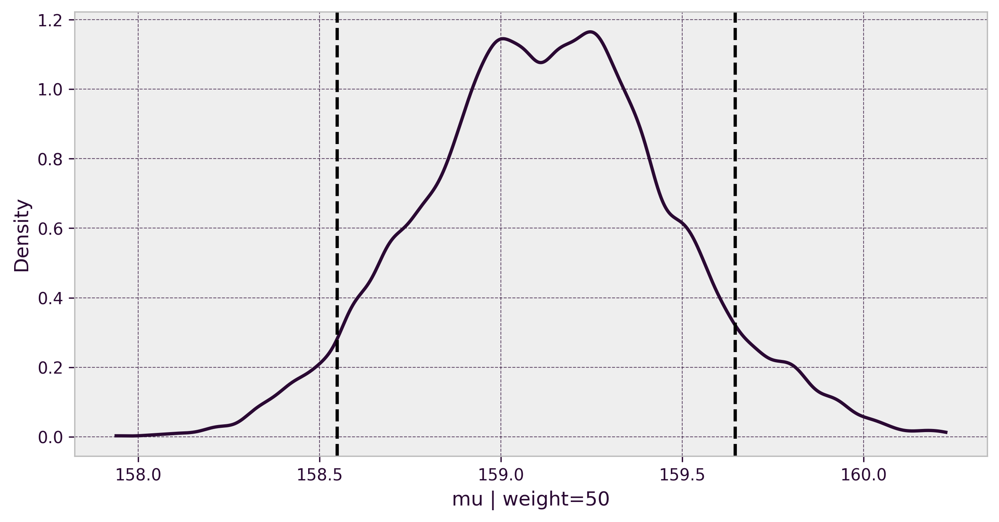

In [24]:
d_dict = {
    "N": len(d2.index), 
    "height": d2['height'].tolist(),
    "weight": d2['weight'].tolist()
}

fit = m4_3.sampling(data=d_dict, chains=4, n_jobs=4, refresh = 0)
post = fit.extract(["alpha", "beta", "sigma"])
mu_at_50 = post['alpha'] + post['beta'] * (50 - np.mean(d2['weight']))

xseq = np.linspace(min(mu_at_50), max(mu_at_50), 1000)
y = utils.build_dens(mu_at_50, xseq, .1)
low, high = utils.hpdi(mu_at_50, .11)
fig, ax = plt.subplots(figsize=(10,5))
ax.plot(xseq, y, color=COLOR)
ax.axvline(low, linestyle = "--", color = "black")
ax.axvline(high, linestyle = "--", color = "black")
ax.set_xlabel("mu | weight=50")
ax.set_ylabel("Density")
plt.show()

We can do better than visualizing uncertainty for a single point. We can do it for the whole set of plausible wieghts.

**Python code 4.53 to python code 4.57 and figure 4.9**

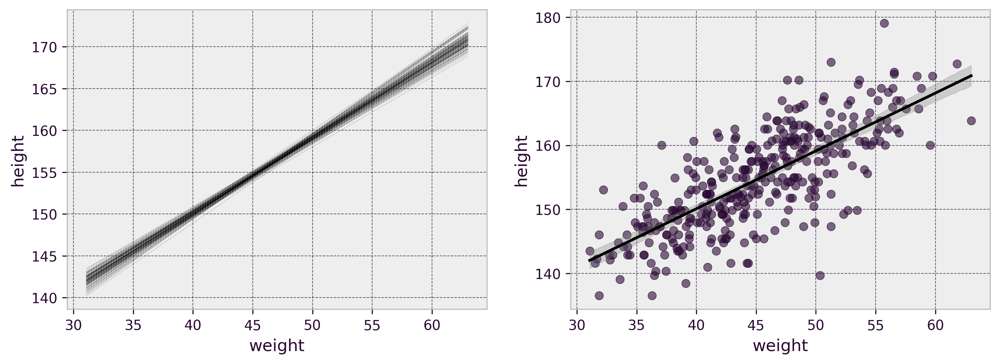

In [25]:
xseq = np.linspace(min(d2['weight']), max(d2['weight']), 1000)

def link(w):
    res = post['alpha'] + post['beta'] * (w - np.mean(d2['weight']))
    return res

post_mu = np.array([link(w) for w in xseq])
mu = np.array([np.mean(m) for m in post_mu])
shade = np.array([utils.hpdi(pm) for pm in post_mu])

fig, axes = plt.subplots(figsize=(12,4), ncols=2)
axes[0].set_xlabel("weight")
axes[0].set_ylabel("height")
for i in range(100):
    axes[0].scatter(xseq, post_mu[:,i], s=.0005,
                    color = "black", alpha = .7)


axes[1].scatter(d2['weight'], d2['height'], 
                alpha = .6, color = COLOR, zorder=1)
axes[1].plot(xseq, mu, zorder = 3, color = "black")
axes[1].fill_between(xseq, shade[:,0], shade[:,1], 
                     color="grey", zorder = 2, alpha = .3)
axes[1].set_xlabel("weight")
axes[1].set_ylabel("height")
plt.show()

That was the mean of the prediction interval. But how about the whole thing?

**Python code 4.58 to python code 4.63 and figure 4.10**

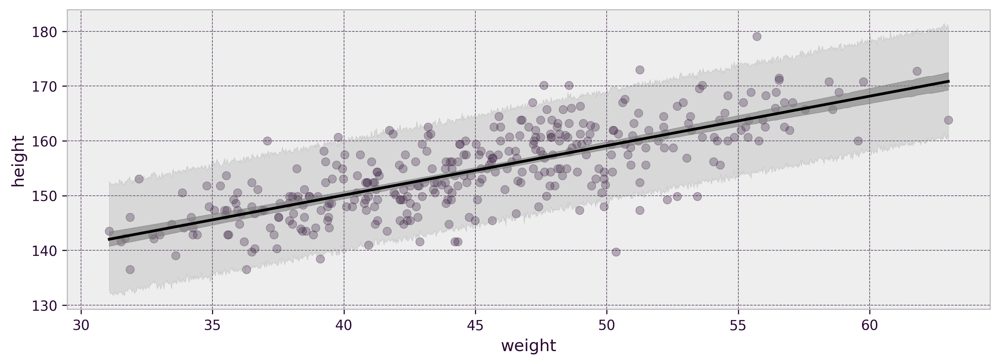

In [26]:
def sim(w):
    m = post['alpha'] + post['beta'] * (w - np.mean(d2['weight']))
    r = stats.norm.rvs(m, post['sigma'], len(m))
    return r

post_mu = np.array([link(w) for w in xseq])
mean_mu = np.array([np.mean(m) for m in post_mu])
shade_mu = np.array([utils.hpdi(pm) for pm in post_mu])

post_height = np.array([sim(w) for w in xseq])
shade_height = np.array([utils.hpdi(h) for h in post_height])

fig, ax = plt.subplots(figsize=(12,4))
ax.scatter(d2['weight'], d2['height'], 
                alpha = .3, color = COLOR, zorder=1)
ax.plot(xseq, mean_mu, color = 'black')
ax.fill_between(xseq, shade_mu[:,0], shade_mu[:,1], 
                     color="grey", zorder = 2, alpha = .6)
ax.fill_between(xseq, shade_height[:,0], shade_height[:,1], 
                     color="grey", zorder = 2, alpha = .2)
ax.set_xlabel("weight")
ax.set_ylabel("height")
plt.show()

## 4.5 - Curves from lines

We're going to add children back in to the data set and fit it with a polynomial.

\begin{align}
h_i &\sim Normal(\mu_i, \sigma)\\
\mu_i &= \alpha + \beta_1 x_i + \beta_2 x_i^2 + ...\\
\alpha &\sim Normal(178, 20) \\
\beta_1 &\sim LogNormal(0, 1) \\
\beta_2 &\sim Normal(0, 1) \\
... \\
\sigma &\sim Uniform(0, 50)
\end{align}

Lets go!

**Python code 4.64 to 4.69 and figure 4.11**

We are going to train a linear, quadratic, and cubic relationship to see the difference.

In [27]:
%%stan m4_5_l
data {
  int N;
  vector[N] height;
  vector[N] weight;
}
parameters {
  real alpha;
  real beta1;
  real<lower=0> sigma;
}
model {
  vector[N] mu;

  alpha ~ normal(178, 20);
  beta1 ~ lognormal(0, 1);
  
  mu = alpha + beta1*weight;
  height ~ normal(mu, sigma);
}

INFO:pystan:COMPILING THE C++ CODE FOR MODEL m4_5_l_7e019962f2339898b5467fad14978af1 NOW.


Creating pystan model & assigning it to variable name "m4_5_l".
Stan options:
 {'model_name': 'm4_5_l', 'include_paths': None, 'boost_lib': None, 'eigen_lib': None, 'verbose': False, 'obfuscate_model_name': True}
StanModel now available as variable "m4_5_l"!
Compilation took 38 seconds.


In [28]:
%%stan m4_5_q
data {
  int N;
  vector[N] height;
  vector[N] weight;
}
parameters {
  real alpha;
  real beta1;
  real beta2;
  real<lower=0> sigma;
}
model {
  vector[N] mu;

  alpha ~ normal(178, 20);
  beta1 ~ lognormal(0, 1);
  beta2 ~ normal(0, 1);
  
  mu = alpha + beta1*weight + beta2*square(weight);
  height ~ normal(mu, sigma);
}

INFO:pystan:COMPILING THE C++ CODE FOR MODEL m4_5_q_0775da5f2d4ba122ca25589d4375e4f5 NOW.


Creating pystan model & assigning it to variable name "m4_5_q".
Stan options:
 {'model_name': 'm4_5_q', 'include_paths': None, 'boost_lib': None, 'eigen_lib': None, 'verbose': False, 'obfuscate_model_name': True}
StanModel now available as variable "m4_5_q"!
Compilation took 34 seconds.


In [29]:
%%stan m4_5_c
data {
  int N;
  vector[N] height;
  vector[N] weight;
}
transformed data {
  vector[N] weight_squared;
  vector[N] weight_cubed;
  weight_squared = square(weight);
  for (i in 1:N) {
    weight_cubed[i] = pow(weight[i],3);
  }
}
parameters {
  real alpha;
  real beta1;
  real beta2;
  real beta3;
  real<lower=0> sigma;
}
model {
  vector[N] mu;

  alpha ~ normal(178, 20);
  beta1 ~ lognormal(0, 1);
  beta2 ~ normal(0, 1);
  beta3 ~ normal(0, 1);
  
  mu = alpha + beta1*weight + beta2*weight_squared + beta3*weight_cubed;
  height ~ normal(mu, sigma);
}

INFO:pystan:COMPILING THE C++ CODE FOR MODEL m4_5_c_485f96e2081c919eb3445f569d906f36 NOW.


Creating pystan model & assigning it to variable name "m4_5_c".
Stan options:
 {'model_name': 'm4_5_c', 'include_paths': None, 'boost_lib': None, 'eigen_lib': None, 'verbose': False, 'obfuscate_model_name': True}
StanModel now available as variable "m4_5_c"!
Compilation took 34 seconds.


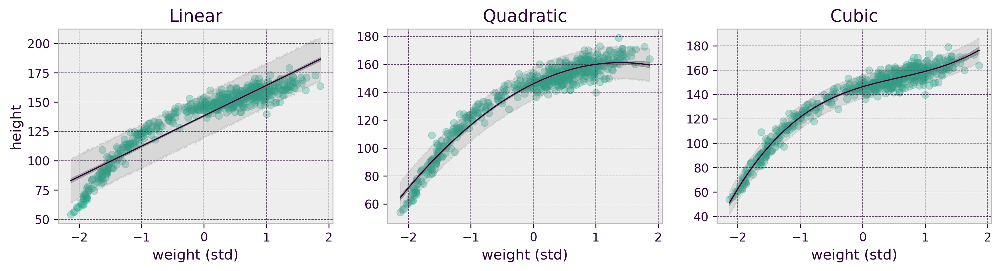

In [30]:
d_dict = {
    "N": len(d.index),
    "height": d['height'].values,
    "weight": d['weight'].values
}

d_dict['weight'] = (d_dict['weight'] - np.mean(d_dict['weight']))/np.std(d_dict['weight'])
fit_m45l = m4_5_l.sampling(data=d_dict, chains=4, n_jobs=4, refresh = 0)
fit_m45q = m4_5_q.sampling(data=d_dict, chains=4, n_jobs=4, refresh = 0)
fit_m45c = m4_5_c.sampling(data=d_dict, chains=4, n_jobs=4, refresh = 0)

xseq = np.linspace(min(d_dict['weight']), max(d_dict['weight']), 1000)
fig, axes = plt.subplots(figsize = (14,3), ncols=3)
for ax in axes:
    ax.scatter(d_dict['weight'], d_dict['height'], 
               color = "#20A387FF", alpha = .3)
    ax.set_xlabel("weight (std)")
axes[0].set_ylabel("height")

# Linear
post = fit_m45l.extract(["alpha", "beta1", "sigma"])
def link(w):
    return post['alpha'] + post['beta1']*w
post_mu = np.array([link(w) for w in xseq])
mean_mu = np.array([np.mean(m) for m in post_mu])
shade_mu = np.array([utils.hpdi(m) for m in post_mu])
def sim(w):
    m = post['alpha'] + post['beta1'] * w
    r = stats.norm.rvs(m, post['sigma'], len(m))
    return r
post_height = np.array([sim(w) for w in xseq])
shade_height = np.array([utils.hpdi(h) for h in post_height])
axes[0].plot(xseq, mean_mu, color = COLOR, linewidth=1)
axes[0].fill_between(xseq, shade_mu[:,0], shade_mu[:,1], 
                     color="grey", zorder = 2, alpha = .6)
axes[0].fill_between(xseq, shade_height[:,0], shade_height[:,1], 
                     color="grey", zorder = 2, alpha = .2)
axes[0].set_title("Linear")
# Quadratic
post = fit_m45q.extract(["alpha", "beta1", "beta2", "sigma"])
def link(w):
    return post['alpha'] + post['beta1']*w + post['beta2']*pow(w,2)
post_mu = np.array([link(w) for w in xseq])
mean_mu = np.array([np.mean(m) for m in post_mu])
shade_mu = np.array([utils.hpdi(m) for m in post_mu])
def sim(w):
    m = post['alpha'] + post['beta1']*w + post['beta2']*pow(w,2)
    r = stats.norm.rvs(m, post['sigma'], len(m))
    return r
post_height = np.array([sim(w) for w in xseq])
shade_height = np.array([utils.hpdi(h) for h in post_height])
axes[1].plot(xseq, mean_mu, color = COLOR, linewidth=1)
axes[1].fill_between(xseq, shade_mu[:,0], shade_mu[:,1], 
                     color="grey", zorder = 2, alpha = .6)
axes[1].fill_between(xseq, shade_height[:,0], shade_height[:,1], 
                     color="grey", zorder = 2, alpha = .2)
axes[1].set_title("Quadratic")
# Cubic
post = fit_m45c.extract(["alpha", "beta1", "beta2", 'beta3', "sigma"])
def link(w):
    return post['alpha'] + post['beta1']*w + post['beta2']*pow(w,2) + post['beta3']*pow(w,3)
post_mu = np.array([link(w) for w in xseq])
mean_mu = np.array([np.mean(m) for m in post_mu])
shade_mu = np.array([utils.hpdi(m) for m in post_mu])
def sim(w):
    m = post['alpha'] + post['beta1']*w + post['beta2']*pow(w,2) + post['beta3']*pow(w,3)
    r = stats.norm.rvs(m, post['sigma'], len(m))
    return r
post_height = np.array([sim(w) for w in xseq])
shade_height = np.array([utils.hpdi(h) for h in post_height])
axes[2].plot(xseq, mean_mu, color = COLOR, linewidth=1)
axes[2].fill_between(xseq, shade_mu[:,0], shade_mu[:,1], 
                     color="grey", zorder = 2, alpha = .6)
axes[2].fill_between(xseq, shade_height[:,0], shade_height[:,1], 
                     color="grey", zorder = 2, alpha = .2)
axes[2].set_title("Cubic")
plt.show()

B-Splines are another way to model non-linearities. We're going to move over to the cherry blossoms data set to look at these.

**Python code 4.72 to python code 4.78**

In [31]:
d = utils.data_from_R("cherry_blossoms", "rethinking")
d.loc[d['doy']<0,'doy'] = pd.NA
d2 = d[~pd.isna(d['doy'])]
d2.describe()

,year,temp,temp_upper,temp_lower
count,827.000000,787.000000,787.000000,787.000000
mean,1548.841596,6.100356,6.937560,5.263545
std,304.149774,0.683410,0.811986,0.762194
min,812.000000,4.690000,5.450000,2.610000
25%,1325.000000,5.625000,6.380000,4.770000
50%,1583.000000,6.060000,6.800000,5.250000
75%,1803.500000,6.460000,7.375000,5.650000
max,2015.000000,8.300000,12.100000,7.740000


We're going to rely on the `patsy` library to generate our design matrix. Patsy is a useful library that tries hard to mimic a lot of R's built in functionality.

In [32]:
from patsy import dmatrix

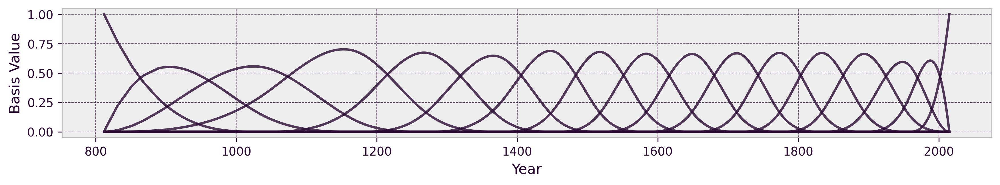

In [33]:
num_knots = 15
knot_list = np.quantile(d2['year'], np.linspace(0, 1, num_knots))
year = d2['year']
B = dmatrix(f"bs(year, knots={tuple(knot_list[1:len(knot_list)-1])}, degree =3, include_intercept=True)",
        {"year": d2['year']}, return_type = "matrix")

fig, ax = plt.subplots(figsize=(14,2))
for i in range(1,B.shape[1]):
    ax.plot(d2['year'], B[:,i], color = COLOR, alpha =.8)
ax.set_xlabel("Year")
ax.set_ylabel("Basis Value")
plt.show()

What we've done here is transform our single `year` column in to 18 columns and plotted each of them above (omitting the intercept). Now we're going to condition the relative weights of these variables to the data so that they fit `doy` best. To do that, we need to build a model.

$$
D_i \sim Normal(\mu_i, \sigma) \\
\mu_i = \alpha + \sum_{k=i}^{K}w_kB_{k,i} \\
\alpha \sim Normal(100, 10) \\
w_j \sim Normal(0, 10) \\
\sigma \sim Exponential(1)
$$

In [34]:
%%stan m4_7
data{
  int<lower=1> N;
  int<lower=1> K;
  real D[N];
  matrix[N, K] B;
}
parameters{
  vector[K] w;
  real<lower=0> sigma;
}
model{
  sigma ~ exponential(1);
  w[2:K] ~ normal(0, 10);
  w[1] ~ normal(100, 10);
  
  D ~ normal(B * w, sigma);
}

INFO:pystan:COMPILING THE C++ CODE FOR MODEL m4_7_036fb018e5b9db7a3b7d5a1fd839a374 NOW.


Creating pystan model & assigning it to variable name "m4_7".
Stan options:
 {'model_name': 'm4_7', 'include_paths': None, 'boost_lib': None, 'eigen_lib': None, 'verbose': False, 'obfuscate_model_name': True}
StanModel now available as variable "m4_7"!
Compilation took 35 seconds.


In [35]:
d_dict = {
    "N": B.shape[0],
    "K": B.shape[1],
    "D": d2["doy"].tolist(),
    "B": np.matrix(B)
}
fit = m4_7.sampling(data=d_dict, chains = 4, n_jobs=4, iter=4000)
print(fit.stansummary(probs=[.055, .945]))

Inference for Stan model: m4_7_036fb018e5b9db7a3b7d5a1fd839a374.
4 chains, each with iter=4000; warmup=2000; thin=1; 
post-warmup draws per chain=2000, total post-warmup draws=8000.

        mean se_mean     sd   5.5%  94.5%  n_eff   Rhat
w[1]  103.37    0.07   2.33  99.53 106.96   1057    1.0
w[2]   -3.04    0.08   3.89   -9.2   3.16   2346    1.0
w[3]   -0.84    0.08   3.86  -6.91   5.28   2211    1.0
w[4]   -1.08    0.08   3.58  -6.76   4.68   2005    1.0
w[5]    4.83    0.08   2.84   0.31   9.36   1418    1.0
w[6]   -0.87    0.07   2.85  -5.43   3.75   1541    1.0
w[7]    4.29    0.07   2.89  -0.26   8.93   1503    1.0
w[8]   -5.33    0.07   2.79  -9.72  -0.87   1411    1.0
w[9]     7.8    0.07    2.8   3.39  12.33   1445    1.0
w[10]  -1.01    0.07   2.82  -5.45   3.52   1509    1.0
w[11]   3.01    0.08   2.93  -1.62   7.68   1523    1.0
w[12]   4.63    0.07   2.84   0.12   9.14   1483    1.0
w[13]  -0.18    0.07   2.87   -4.7   4.51   1520    1.0
w[14]   5.55    0.08   2.88   1.0

For the previous graph, we created a new basis. We've now found weights to transform that basis. Lets plot that change of basis.

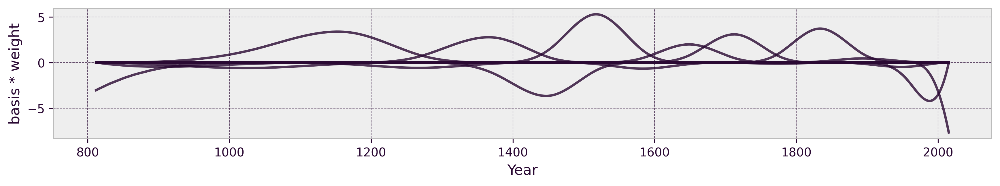

In [36]:
post = fit.extract()
w_mu = np.array([np.mean(w) for w in np.transpose(post['w'])])
bw = np.multiply(B[:,1:len(w_mu)], w_mu[1:len(w_mu)])

fig, ax = plt.subplots(figsize=(14,2))
for i in range(len(w_mu)-1):
    ax.plot(d2['year'], bw[:,i], color = COLOR, alpha = .8)
ax.set_xlabel("Year")
ax.set_ylabel("basis * weight")
plt.show()

Finally, we combine these pieces together and scale it all up by the intercept.

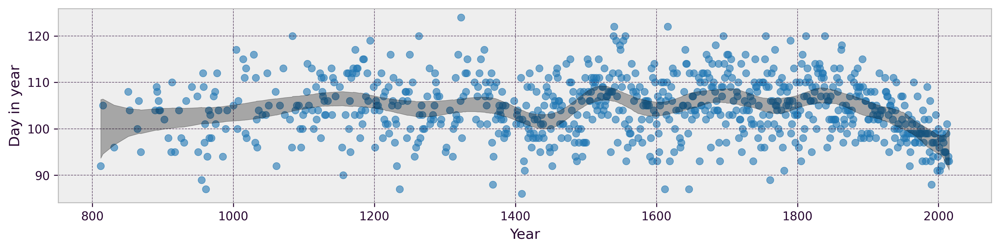

In [37]:
# Calculate posterior mean for each observation
post_link = np.matmul(B, np.transpose(post["w"]))
# Summarize posterior
mu_doy = np.array([np.mean(obs) for obs in post_link])
shade_doy = np.array([utils.hpdi(obs) for obs in post_link])
# Plot
fig, ax = plt.subplots(figsize=(14,3))
ax.scatter(d2['year'], d2['doy'], alpha=.6, zorder=1)
ax.fill_between(d2['year'], shade_doy[:,0], shade_doy[:,1], 
                     color="black", zorder = 2, alpha = .3)
ax.set_xlabel("Year")
ax.set_ylabel("Day in year")
plt.show()

Now, lets put all these plots together to make **figure 4.12**. We're going to use 5 knots instead of fifteen this time.

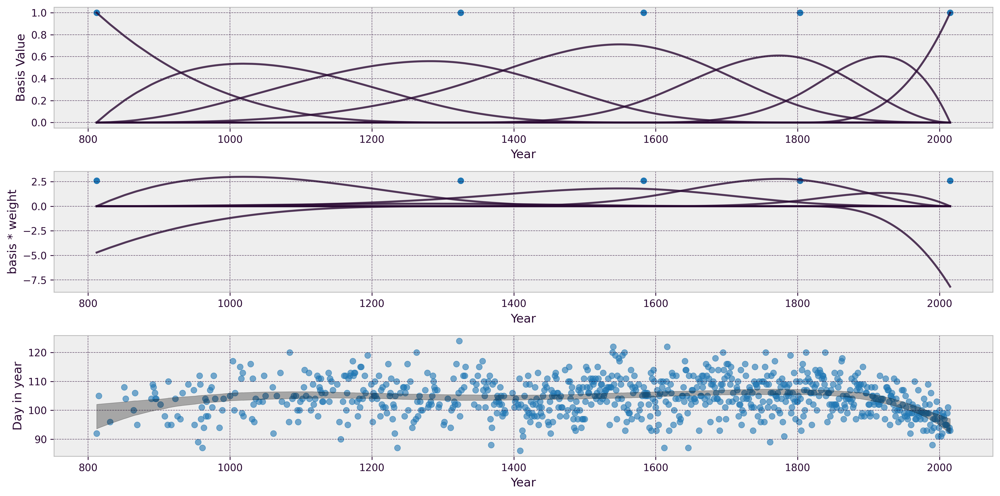

In [38]:
# Create design matrix
num_knots = 5
knot_list = np.quantile(d2['year'], np.linspace(0, 1, num_knots))
B = dmatrix(f"bs(year, knots={tuple(knot_list[1:len(knot_list)-1])}, degree =3, include_intercept=True)",
        {"year": d2['year']}, return_type = "matrix")

# Train Model
d_dict = {
    "N": B.shape[0],
    "K": B.shape[1],
    "D": d2["doy"].tolist(),
    "B": np.matrix(B)
}
fit = m4_7.sampling(data=d_dict, chains = 4, n_jobs=4, iter=4000)

post = fit.extract()
w_mu = np.array([np.mean(w) for w in np.transpose(post['w'])])
bw = np.multiply(B[:,1:len(w_mu)], w_mu[1:len(w_mu)])

fig, axes = plt.subplots(figsize=(14, 7), nrows = 3)

for i in range(1,B.shape[1]):
    axes[0].plot(d2['year'], B[:,i], color = COLOR, alpha =.8)
axes[0].set_xlabel("Year")
axes[0].set_ylabel("Basis Value")
axes[0].scatter(knot_list, [1]*num_knots)

for i in range(len(w_mu)-1):
    axes[1].plot(d2['year'], bw[:,i], color = COLOR, alpha = .8)
axes[1].set_xlabel("Year")
axes[1].set_ylabel("basis * weight")
axes[1].scatter(knot_list, [2.6]*num_knots)

# Calculate posterior mean for each observation
post_link = np.matmul(B, np.transpose(post["w"]))
mu_doy = np.array([np.mean(obs) for obs in post_link])
shade_doy = np.array([utils.hpdi(obs) for obs in post_link])
axes[2].scatter(d2['year'], d2['doy'], alpha=.6, zorder=1)
axes[2].fill_between(d2['year'], shade_doy[:,0], shade_doy[:,1], 
                     color="black", zorder = 2, alpha = .3)
axes[2].set_xlabel("Year")
axes[2].set_ylabel("Day in year")
plt.tight_layout()
plt.show()